<a href="https://colab.research.google.com/github/JhonVillacis/EPIC_3/blob/main/EPIC_Junior/M%C3%A9todos_Monte_Carlo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Métodos Monte Carlo


In [1]:
import numpy as np # Operaciones matemáticas
import matplotlib.pyplot as plt # Creación de gráficos
from random import random # Generador de números aleatorios
import os # Operaciones del sistema operativo
import glob # Creación de animaciones
from PIL import Image # Creación de animaciones
from IPython import display # Creación de animaciones

## Estimación de $\pi$

### 1. Determinación del dominio de posibles entradas.
Cuarto de círculo inscrito en un cuadrado.

$A_◯ = \pi r^2$

$A_{◯/4} = \frac{\pi r^2}{4}$

$A_□ = r^2$

$\frac{A_{◯/4}}{A_□} = \frac{\pi}{4}$

In [2]:
# Definimos un radio
radio = 3

# Cálculo de las coordenadas cartesianas del círculo (x^2 + y^2 = r^2)
x_circulo = np.linspace(0, radio, 300, endpoint = True)
y_circulo = np.sqrt(radio**2 - x_circulo**2)

In [3]:
#print(x_circulo)
#print(y_circulo)

In [ ]:
# Gráfico el dominio
plt.figure(figsize=(5,5))

plt.plot(x_circulo, y_circulo)

plt.xlim(0,radio)
plt.ylim(0,radio)

plt.show()
plt.close()

### 2. Generación de entradas aleatorias.
Puntos con posiciones aleatorias.

In [5]:
#print(random()) # random() genera un valor aleatorio entre 0 y 1

In [6]:
# Definición del número de puntos
N = 20

# Arreglos vacíos para almacenar las coordenadas de los puntos
x_puntos = np.array([])
y_puntos = np.array([])

# Llenado de los arreglos con coordenadas aleatorias
for j in range(N):
    x_puntos = np.append(x_puntos, random()*radio)
    y_puntos = np.append(y_puntos, random()*radio)

In [ ]:
# Gráfica del dominio con los puntos generados
plt.figure(figsize=(5,5))

plt.plot(x_puntos, y_puntos, marker='x', linestyle=' ', color = 'red')
plt.plot(x_circulo, y_circulo)

plt.xlim(0,radio)
plt.ylim(0,radio)

plt.show()

### 3. Cálculo determinista sobre las entradas.

Conteo de puntos.


In [8]:
# Cálculo de la distancia de cada punto con respecto a (0,0)
dist_puntos = np.sqrt(x_puntos**2 + y_puntos**2)

In [9]:
#np.where(dist_puntos <= radio) # Regresa los  índices en los cuales se cumple la condición

In [10]:
# Separación de los puntos de dentro y fuera del círculo

# Puntos dentro del círculo
x_puntos_dentro = x_puntos[np.where(dist_puntos <= radio)]
y_puntos_dentro = y_puntos[np.where(dist_puntos <= radio)]

# Puntos fuera del círculo
x_puntos_fuera = x_puntos[np.where(dist_puntos > radio)]
y_puntos_fuera = y_puntos[np.where(dist_puntos > radio)]

In [ ]:
# Gráfica del dominio con los puntos marcados con colores distintos
plt.figure(figsize = (6,6))
plt.plot(x_circulo, y_circulo)
plt.plot(x_puntos_dentro, y_puntos_dentro,  marker='x', linestyle=' ', color = 'red')
plt.plot(x_puntos_fuera, y_puntos_fuera, marker='x', linestyle=' ', color = 'green')
plt.xlim(0,radio)
plt.ylim(0,radio)
plt.show()

### 4. Construción de los resultados.
Estimacion de $\pi$ mediante la fórmula obtenida.

In [12]:
# Estimación de π
pi = 4*len(x_puntos_dentro)/len(x_puntos)
print('π ≈', pi)

π ≈ 3.8


### Evolución de la estimación de $\pi$ con el número de puntos.

In [14]:
def puntos_func(N):
    '''Función para gráficar los puntos aleatorios y la estimación obtenida.
    Input: N (Número de puntos).
    Output: Gráfica de los puntos.'''
    # Cálculo de las coordenadas cartesianas del círculo (x^2 + y^2 = r^2)
    x_circulo = np.linspace(0, 1, 200, endpoint = True)
    y_circulo = np.sqrt(1**2 - x_circulo**2)

    # Arreglos vacíos para almacenar las coordenadas de los puntos
    x_puntos = np.array([])
    y_puntos = np.array([])

    # Llenado de los arreglos con coordenadas aleatorias
    for j in range(N):
        x_puntos = np.append(x_puntos, random())
        y_puntos = np.append(y_puntos, random())

    # Cálculo de la distancia de cada punto con respecto a (0,0)
    dist_puntos = np.sqrt(x_puntos**2 + y_puntos**2)

    # Separación de los puntos de dentro y fuera del círculo
    # Puntos dentro del círculo
    x_puntos_dentro = x_puntos[np.where(dist_puntos <= 1)]
    y_puntos_dentro = y_puntos[np.where(dist_puntos <= 1)]

    # Puntos fuera del círculo
    x_puntos_fuera = x_puntos[np.where(dist_puntos > 1)]
    y_puntos_fuera = y_puntos[np.where(dist_puntos > 1)]

    # Estimación de π
    pi = 4*len(x_puntos_dentro)/len(x_puntos)

    # Gráfica del dominio con los puntos aleatorios
    plt.figure(figsize = (6,6))
    plt.title(r'$\pi \approx$'+str(pi))
    plt.plot(x_circulo, y_circulo)
    plt.plot(x_puntos_dentro, y_puntos_dentro,  marker='.', linestyle=' ', color = 'red')
    plt.plot(x_puntos_fuera, y_puntos_fuera, marker='.', linestyle=' ', color = 'green')
    plt.xlim(0,1)
    plt.ylim(0,1)
    plt.show()
    plt.close()

In [ ]:
# Llamado a la función
puntos_func(5)

In [17]:
def valores_pi_func(N):
    '''Función para gráficar de la evolución de la estimación de π al aumentar
    el número de puntos.
    Input: N (Número de puntos).
    Output: Gráfica de la evolución de la estimación de π.'''

    # Contador de puntos dentro del círculo y puntos totales
    puntos_circulo = 0
    puntos_totales = 0

    # Arreglo vacío para los valores de π
    pi_valores = np.array([])

    for i in range(N):
        # Generación de un punto con coordenadas aleatorias
        x_punto = random()
        y_punto = random()

        # Cálculo de la distancia del punto con respecto a (0,0)
        dist_punto = np.sqrt(x_punto**2 + y_punto**2)

        # Conteo de los puntos totales y los que estén dentro del círculo
        puntos_totales += 1
        if dist_punto <= 1:
            puntos_circulo += 1

        # Estimación de π
        pi = 4*(puntos_circulo/puntos_totales)
        pi_valores = np.append(pi_valores, pi)

    # Gráfica de la evolución de la estimación de π
    plt.figure()
    plt.title(r'$\pi \approx$'+str(pi))
    plt.plot(pi_valores)
    plt.xlabel('N')
    plt.axhline(y = np.pi, color = 'red', linestyle='--')
    plt.show()
    plt.close()

In [ ]:
# Llamado a la función
valores_pi_func(10)

In [ ]:
# Creación de una carpeta para la animación
directory = './PImages'
if os.path.isdir(directory):
    print("La carpeta ya existe.")
else:
    print("Creando carpeta.")
    os.mkdir(directory)

In [22]:
def valores_pi_GIF_func(N, Not):
    '''Función para guardar gráficas de los puntos aleatorios y la evolución de
    la estimación de π al aumentar el número de puntos.
    Inputs: N (Número de puntos), Not (Intervalo de notificación, 0 para no notificar).
    Outputs: Gráficas de los puntos y π vs N.'''

    # Cálculo las coordenadas  cartesianas del círculo (x^2 + y^2 = r^2)
    x_circulo = np.linspace(0, 1, 200, endpoint = True)
    y_circulo = np.sqrt(1**2 - x_circulo**2)

    # Arreglos vacíos para almacenar las coordenadas de los puntos y valores de π
    x_puntos_dentro = np.array([])
    y_puntos_dentro = np.array([])
    x_puntos_fuera = np.array([])
    y_puntos_fuera = np.array([])
    pi_valores = np.array([])

    # Llenado de los arreglos con coordenadas aleatorias
    for i in range(N):
        x_punto = random()
        y_punto = random()

        # Cálculo de la distancia de cada punto con respecto a (0,0)
        dist_punto = np.sqrt(x_punto**2 + y_punto**2)

        # Separación de los puntos dentro y fuera del círculo
        if dist_punto <= 1:
            # Puntos dentro del círculo
            x_puntos_dentro = np.append(x_puntos_dentro, x_punto)
            y_puntos_dentro = np.append(y_puntos_dentro, y_punto)
        else:
            # Puntos fuera del círculo
            x_puntos_fuera = np.append(x_puntos_fuera, x_punto)
            y_puntos_fuera = np.append(y_puntos_fuera, y_punto)

        # Estimación de π
        pi = 4*len(x_puntos_dentro)/(i+1)
        pi_valores = np.append(pi_valores, pi)

        # Gráficas
        plt.figure(figsize = (10,5))

        # Gráfica de los puntos
        plt.subplot(1,2,1)
        plt.title('N = '+str(i+1))
        plt.plot(x_circulo, y_circulo)
        plt.plot(x_puntos_dentro, y_puntos_dentro,  marker='.', linestyle=' ', color = 'red')
        plt.plot(x_puntos_fuera, y_puntos_fuera, marker='.', linestyle=' ', color = 'green')
        plt.xlim(0,1)
        plt.ylim(0,1)

        # Gráfica π vs N
        plt.subplot(1,2,2)
        plt.title(r'$\pi \approx$'+str('%.6f' %pi))
        plt.axhline(y = np.pi, color = 'red', linestyle='--')
        plt.plot(pi_valores)
        plt.ylabel('Pi')
        plt.xlabel('N')
        plt.xlim(0,N)
        plt.ylim(-0.1,4.5)
        #plt.show()
        plt.savefig(directory+'/PI{:06d}.png'.format(i))
        plt.close()

        #Notificación del número de gráfica guardada
        if(Not!=0):
          if(i%Not==0):
            print(i)

In [ ]:
# Llamado a la función
#valores_pi_GIF_func(N, Intervalo de notificación (0 para no notificar))
valores_pi_GIF_func(1000,10)

In [31]:
def gif_func(images_input,imgif_output):
    '''
    Función para crear un GIF(animación) a partir de las gráficas guardadas.
    '''
    # Obtención de las imagenes guardadas previamente
    imgs = (Image.open(f) for f in sorted(glob.glob(images_input)))
    img = next(imgs)
    # Creación y guardo del GIF
    img.save(fp = imgif_output, format="GIF", append_images=imgs, save_all=True, duration = 1, loop = 0)

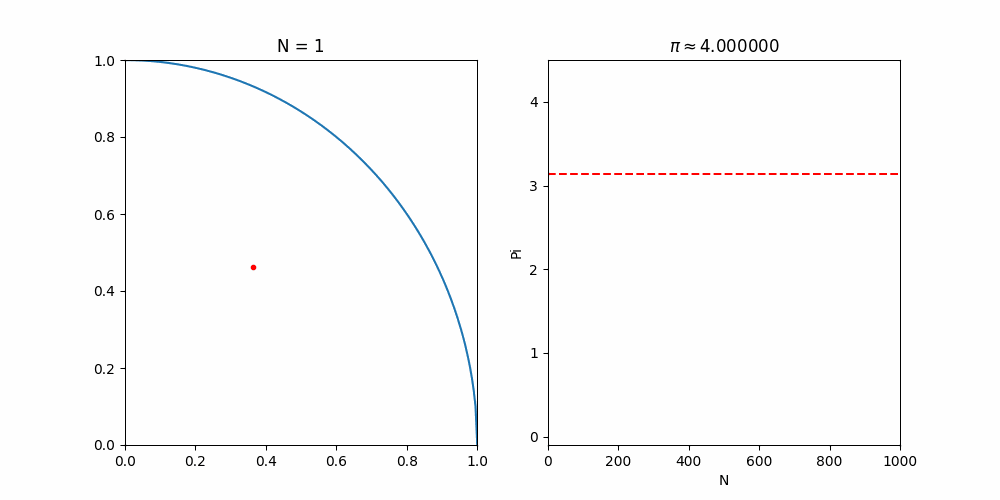

In [32]:
# Dirección de los archivos necesarios para la animación
imagenes = directory+'/PI*******.png'
GIF = directory+'/PI.gif'

# Llamando a la función para crear el GIF (animación)
gif_func(imagenes,GIF)

# Mostrar animacón
display.Image(open(GIF,'rb').read())

## Desintegración radioactiva

$$N(t)=N_0\,\exp(-\lambda t)$$

$$\lambda=\frac{1}{\tau}$$

$$t_{1/2}=\frac{ln(2)}{\lambda}$$

In [33]:
# Constante de desintegración (Decay constant)
lambda1 = 0.01
#lambda1 = np.log(2)/5.73e3

# Número de isótopos radioactivos
N0 = 10000

# Tiempo
tiempo = 1000
#tiempo = 13*5.73e3

In [35]:
# Valores iniciales
isotopos_restantes = isotopos_desintegrados = N0

# Número de isótopos y tiempo
isotopos = np.array([])
t = np.arange(0, tiempo)

# Bucle de tiempo
for i in t:

    # Bucle de desintegración
    isotopos_desintegrados = 0
    for atom in range(1, isotopos_restantes):
        decay = random()
        if (decay  <  lambda1):
            # Conteo de desintegraciones
            isotopos_desintegrados += 1

    isotopos_restantes  -= isotopos_desintegrados
    isotopos = np.append(isotopos, isotopos_restantes)

In [ ]:
# Gráfica del número de isótopos vs tiempo
plt.plot(t, (N0*np.exp(-lambda1*t)), label='Modelo matemático', color='orange')
plt.plot(t, isotopos, label='Monte Carlo', linestyle='--', color='dodgerblue')
plt.xlabel("Tiempo")
plt.ylabel("N")
plt.legend()
plt.show()
plt.close()

In [ ]:
# Gráfica detallada del número de isótopos vs tiempo
plt.plot(t, np.log(N0*np.exp(-lambda1*t)), label='Modelo matemático', color='darkorange')
plt.plot(t, np.log(isotopos), label='Monte Carlo', color='dodgerblue')
plt.xlabel("Tiempo")
plt.ylabel("N")
plt.legend()
plt.ylim(-0.5, 12)
plt.show()
plt.close()